In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## Load file: Orno-400-TaO100- run 2 042623

In [2]:
data_folder = 'Orno-400-TaO100- run 2 042623'
# Gray
Gray_file = f'{data_folder}/ResultGrayMi.csv'
df_gray = pd.read_csv(Gray_file)

#Red
Red_file = f'{data_folder}/ResultRedMi.csv'
df_red = pd.read_csv(Red_file)

#Green
Green_file = f'{data_folder}/ResultGreenMi.csv'
df_green = pd.read_csv(Green_file)

#Blue
Blue_file = f'{data_folder}/ResultBlueMi.csv'
df_blue = pd.read_csv(Blue_file)

### Create a new row with column names


In [3]:
def create_columns_name(df):
    # Create a new row with numerical column names
    column_names = ['time'] + [f'sensor_{i}' for i in range(1, len(df.columns))]
    df_processed = pd.DataFrame([column_names] + df.values.tolist())

    # Update the column names of the DataFrame
    df_processed.columns = df_processed.iloc[0]

    # Remove the first row (numerical column names)
    df_processed = df_processed.iloc[1:]

    return df_processed


# Process each DataFrame individually
df_gray = create_columns_name(df_gray)
df_red = create_columns_name(df_red)
df_green = create_columns_name(df_green)
df_blue = create_columns_name(df_blue)

In [4]:
df_green

,time,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,...,sensor_54,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_60,sensor_61,sensor_62,sensor_63
1,1.478106,0.145722,0.045816,0.192741,0.13058,0.085362,0.082034,0.059604,0.109909,-0.008024,...,0.011834,0.102826,0.032482,-0.046593,0.065718,0.050368,0.005036,0.050255,0.060492,0.061483
2,2.557962,0.110356,0.055572,0.115866,0.123705,0.177029,0.085239,0.048347,-0.018216,-0.144899,...,0.02997,0.069493,0.04499,-0.051593,0.157593,-0.005292,-0.035989,0.149741,-0.025692,-0.08871
3,3.47808,-0.046351,0.023255,-0.182259,0.03433,0.19049,-0.218607,-0.171791,-0.000091,-0.176149,...,-0.022563,0.065006,-0.172646,-0.118468,0.036343,0.040987,-0.121887,0.063734,0.110492,0.017195
4,4.484089,-0.002449,-0.009062,-0.182884,0.09558,0.155234,-0.048094,-0.035455,0.028659,-0.223024,...,-0.016934,0.07398,-0.038813,-0.107218,-0.163032,-0.035936,-0.128297,-0.007512,0.038782,-0.115025
5,4.981684,0.057917,-0.057843,-0.018509,0.09183,0.264208,-0.18271,-0.022948,-0.166966,-0.197399,...,0.128156,0.112441,0.040612,-0.194718,-0.131782,0.046616,0.006318,0.057957,-0.009903,0.022972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2330,2112.915538,-1.3244,-1.204794,1.105241,4.24433,3.844977,-0.723735,-1.764036,-1.940716,-2.004899,...,-2.132006,-1.649097,-2.051321,0.138407,-0.201157,-0.976524,-2.33022,-0.838064,-1.600034,-1.253665
2331,2113.454914,-1.496961,-1.251745,1.142741,4.367455,3.820618,-0.575017,-1.645211,-1.952591,-1.788649,...,-2.067591,-1.658712,-1.821802,0.319657,-0.134282,-1.128494,-2.219964,-0.817524,-1.550692,-1.175359
2332,2114.444609,-1.358546,-1.078574,1.039616,4.22058,3.953311,-0.760274,-1.648964,-1.886966,-1.906149,...,-2.07447,-1.73243,-2.027556,0.033407,-0.261157,-1.133497,-2.360989,-0.80918,-1.536218,-1.193331
2333,2115.447981,-1.44818,-1.329794,0.992116,4.187455,3.77767,-0.614761,-1.656468,-1.901341,-1.886149,...,-2.076347,-1.728584,-1.896224,0.016532,-0.200532,-1.162265,-2.259066,-0.777088,-1.423718,-1.148401


#

# Band comparison 

### STD comparison 

In [5]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray.iloc[:, 1:], axis=0)
std_red = np.std(df_red.iloc[:, 1:], axis=0)
std_green = np.std(df_green.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue.iloc[:, 1:], axis=0)

# Create a table of standard deviation values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table_STD = pd.DataFrame({'Sensor': sensors, 'Gray': std_gray, 'Red': std_red, 'Green': std_green,
                             'Blue': std_blue})

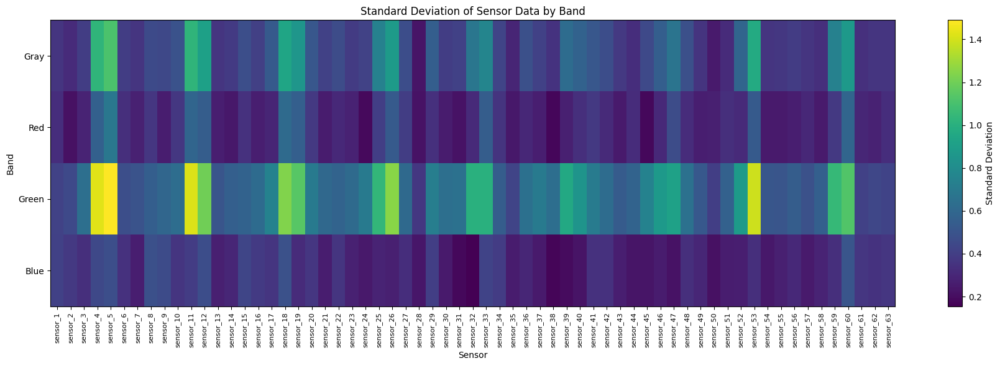

In [6]:
# Visualize the result as a heatmap
result_data = result_table_STD.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Standard Deviation')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('Standard Deviation of Sensor Data by Band')
plt.tight_layout()
plt.show()

#### Most responsive Sensors

In [7]:
# Calculate the average std for each band
average_std = result_table_STD[['Gray', 'Red', 'Green', 'Blue']].mean(axis=1)

# Rank the sensors based on their average std values
ranked_sensors = average_std.sort_values(ascending=False)

# Get the top 10 most responsive sensors
top_10_sensors = ranked_sensors.index[:10]

# Print the result
print("\033[1;34mMost responsive sensor\033[0m:", top_10_sensors[0], "(Avg Std:", average_std[top_10_sensors[0]], ")")
print("\n\033[1;34mTop 10 most responsive sensors:\033[0m")
for i, sensor in enumerate(top_10_sensors[1:], start=2):
    suffix = "st" if i == 1 else "nd" if i == 2 else "rd" if i == 3 else "th"
    print(f"{i}{suffix}: {sensor} (Avg Std: {average_std[sensor]:.6f})")

Most responsive sensor: sensor_5 (Avg Std: 0.939966305847515 )

Top 10 most responsive sensors:
2nd: sensor_4 (Avg Std: 0.867991)
3rd: sensor_11 (Avg Std: 0.857800)
4th: sensor_18 (Avg Std: 0.819653)
5th: sensor_53 (Avg Std: 0.806498)
6th: sensor_12 (Avg Std: 0.782681)
7th: sensor_60 (Avg Std: 0.773712)
8th: sensor_26 (Avg Std: 0.734083)
9th: sensor_19 (Avg Std: 0.719058)
10th: sensor_33 (Avg Std: 0.684161)


#### Most suitable bands 

In [8]:
# Calculate the average std for each band
average_std = result_table_STD[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_std.sort_values(ascending=False)

# Print the result in blue color
print("\033[94mMost Suitable Band for Further Analysis:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg Std: {avg_std:.4f})")

Most Suitable Band for Further Analysis:
1st: Green (Avg Std: 0.7289)
2st: Gray (Avg Std: 0.5168)
3st: Red (Avg Std: 0.3403)
4st: Blue (Avg Std: 0.3184)


#

### SNR comparison 

In [9]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray.iloc[:, 1:], axis=0)
std_red = np.std(df_red.iloc[:, 1:], axis=0)
std_green = np.std(df_green.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue.iloc[:, 1:], axis=0)

# Compute mean by columns (sensors) for each band
mean_gray = np.mean(df_gray.iloc[:, 1:], axis=0)
mean_red = np.mean(df_red.iloc[:, 1:], axis=0)
mean_green = np.mean(df_green.iloc[:, 1:], axis=0)
mean_blue = np.mean(df_blue.iloc[:, 1:], axis=0)

# Compute SNR for each band
snr_gray = mean_gray / std_gray
snr_red = mean_red / std_red
snr_green = mean_green / std_green
snr_blue = mean_blue / std_blue



# Create a table of SNR values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table_SNR = pd.DataFrame({'Sensor': sensors, 'Gray': snr_gray, 'Red': snr_red, 'Green': snr_green,
                             'Blue': snr_blue})

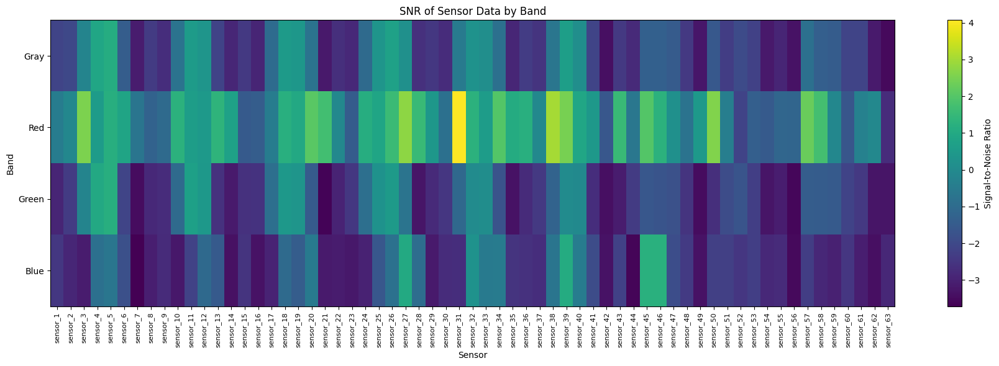

In [10]:
# Visualize the result as a heatmap
result_data = result_table_SNR.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Signal-to-Noise Ratio')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('SNR of Sensor Data by Band')
plt.tight_layout()
plt.show()

In [12]:
# Calculate the average std for each band
average_SNR = result_table_SNR[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_SNR.sort_values(ascending=False)

# Print the result in blue color
print("\033[94mLess noisy:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg SNR: {avg_std:.4f})")

Less noisy:
1st: Red (Avg SNR: 0.3403)
2st: Gray (Avg SNR: 0.5168)
3st: Green (Avg SNR: 0.7289)
4st: Blue (Avg SNR: 0.3184)


#

## Band visualisation 

### Plot Green Band 

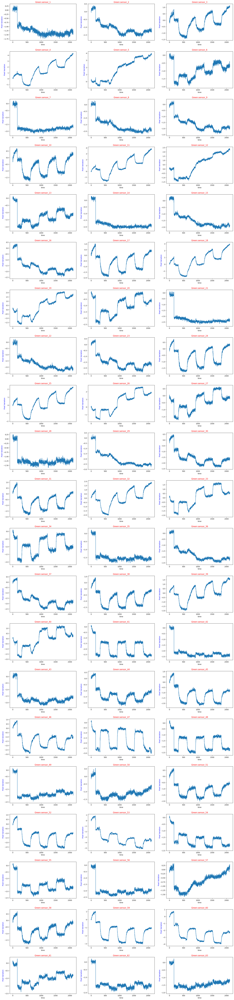

In [13]:
# Get the column names excluding the frame column
df = df_green
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    ax.set_title(f"Green:{sensor}", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#### Filtred Δ%R green data

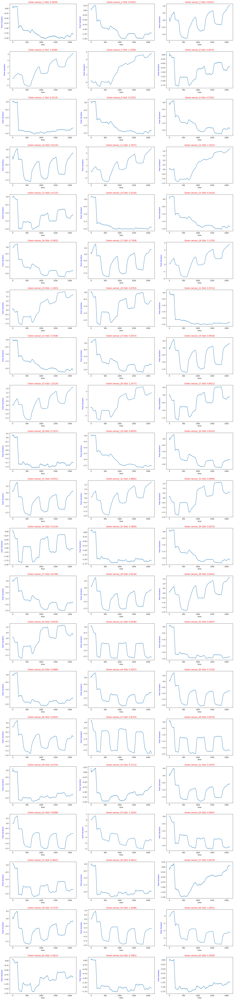

In [14]:
# Get the column names excluding the frame column
sensor_columns = df_green.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data
window_size = 50 # Adjust the window size as desired
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    filtered_data = df_green[sensor].rolling(window=window_size, min_periods=1).mean()
    ax.plot(df_green['time'], filtered_data) 
    std_value = np.std(df_green[sensor].rolling(window=window_size, min_periods=1).mean().iloc[window_size - 1:].values)
    ax.set_title(f"Green {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis


# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot gray band 

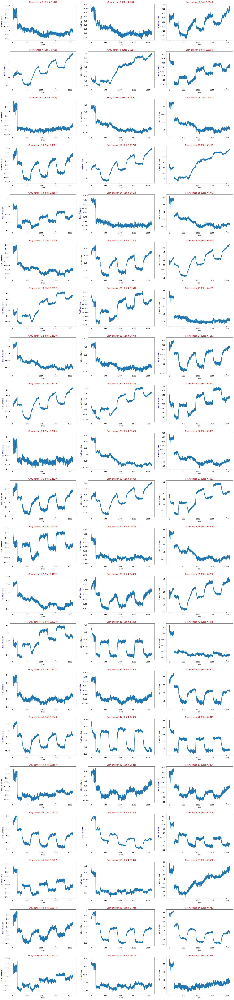

In [15]:
# Get the column names excluding the frame column
df = df_gray
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Gray {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Red Band

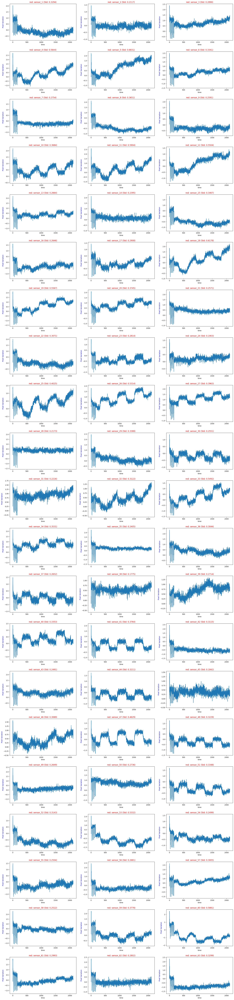

In [16]:
# Get the column names excluding the frame column
df = df_red
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"red: {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Blue Band

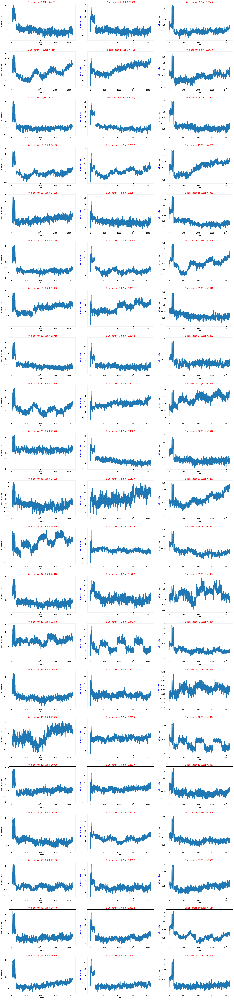

In [17]:
# Get the column names excluding the frame column
df = df_blue
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Blue: {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### plot the 4 bands data for the 10 most responsive sensors


The 10 most responsive sensors



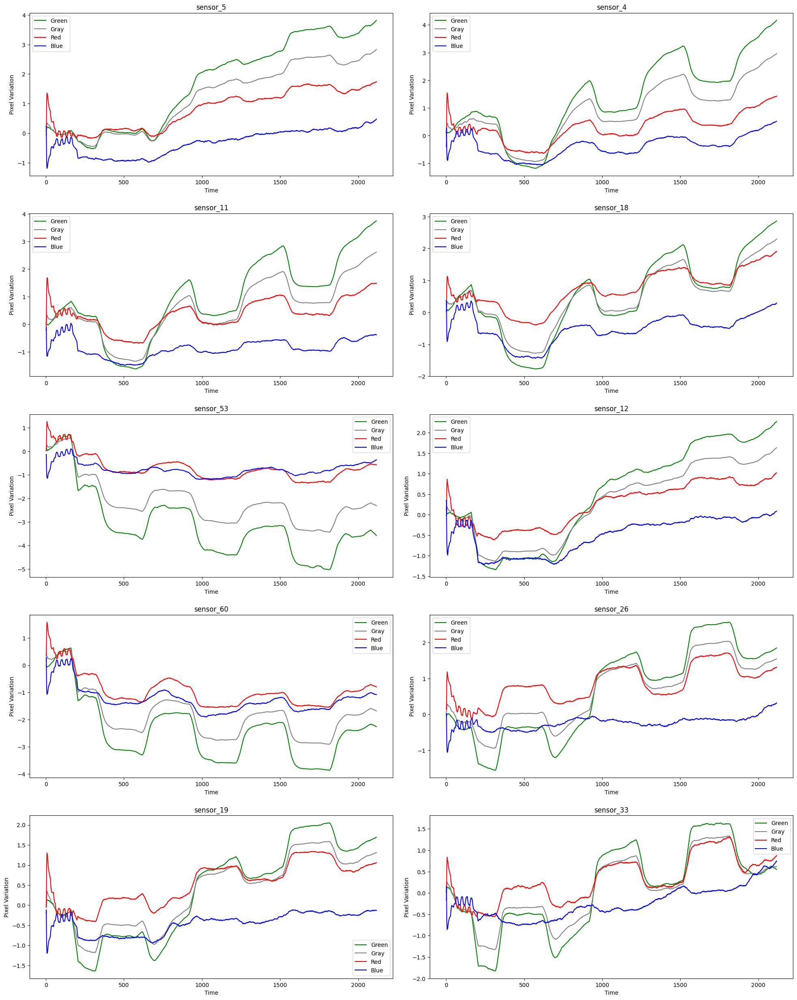

In [18]:
# Define the number of sensors to plot
num_sensors = 10  # Adjust the number of sensors as desired

# Get the top 10 most responsive sensors
top_sensors = ranked_sensors.index[:num_sensors]

# Set the layout of the subplots
subplot_rows = int((num_sensors + 1) / 2)  # Adjust the number of rows as needed
subplot_cols = 2  # Number of columns is fixed at 2 for two subplots per row

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 5 * subplot_rows))

# Flatten the axes array if necessary
axes = axes.flatten()


# Print the title with an increased font size
print('\n\033[1mThe 10 most responsive sensors\033[0m\n')

# Apply moving average and plot the smoothed data for each sensor and band
window_size = 50  # Adjust the window size as desired
for i, sensor in enumerate(top_sensors):
    ax = axes[i]
    filtered_green = df_green[sensor].rolling(window=window_size, min_periods=1).mean()
    filtered_gray = df_gray[sensor].rolling(window=window_size, min_periods=1).mean()
    filtered_red = df_red[sensor].rolling(window=window_size, min_periods=1).mean()
    filtered_blue = df_blue[sensor].rolling(window=window_size, min_periods=1).mean()

    ax.plot(df_green['time'], filtered_green, label='Green', color='green')
    ax.plot(df_gray['time'], filtered_gray, label='Gray', color='gray')
    ax.plot(df_red['time'], filtered_red, label='Red', color='red')
    ax.plot(df_blue['time'], filtered_blue, label='Blue', color='blue')
    ax.set_title(f"{sensor}")
    ax.set_xlabel('Time')
    ax.set_ylabel('Pixel Variation')
    ax.legend()

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)

# Show the plot
plt.show()

